In [256]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import sklearn.linear_model as skl


In [160]:

#cdc 
suicides = pd.read_csv('../data/suicide/suicide_report.csv')
suicides

,Year,State,Deaths,Population,Crude Rate,Age-Adjusted Rate,Years of Potential Life Lost
0,2020,Alabama,793,"4,921,532",16.11,15.91,"16,261"
1,2020,Alaska,204,"731,158",27.90,27.18,"5,460"
2,2020,Arizona,"1,363","7,421,401",18.37,17.63,"27,300"
3,2020,Arkansas,583,"3,030,522",19.24,19.15,"12,603"
4,2020,California,"4,144","39,368,078",10.53,9.98,"80,707"
...,...,...,...,...,...,...,...
1030,Race: All Races,NaN,NaN,NaN,NaN,NaN,NaN
1031,Ethnicity: All Ethnicities,NaN,NaN,NaN,NaN,NaN,NaN
1032,Metro / Non-Metro Indicator: None Selected,NaN,NaN,NaN,NaN,NaN,NaN
1033,YPLL Age: 65,NaN,NaN,NaN,NaN,NaN,NaN


In [161]:
#emdat disasters database
read_file = pd.read_excel ("../data/disasters/emdat_disasters.xlsx")


~/opt/anaconda3/lib/python3.9/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [162]:
read_file.to_csv ("Test.csv", 
                  index = None,
                  header=True)

In [163]:
disasters = pd.DataFrame(pd.read_csv("Test.csv"))

In [164]:
disasters

,Source:,"EM-DAT, CRED / UCLouvain, Brussels, Belgium",Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49
0,NaN,www.emdat.be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Version:,2023-05-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,File creation:,"Mon, 08 May 2023 19:13:26 CEST",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Table type:,Custom request,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,# of records:,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,2023-0032-USA,2023,0032,NaN,Natural,Meteorological,Storm,Convective storm,Tornado,NaN,...,NaN,NaN,NaN,715000,NaN,NaN,1,3214;3224,NaN,"Alabama, Georgia (Adm1)."
1366,2023-0176-USA,2023,0176,NaN,Natural,Meteorological,Storm,Convective storm,Tornado,NaN,...,NaN,NaN,NaN,10000,NaN,NaN,1;2,3214;3224;3256,30127;30141,"Alabama, Georgia, Tennessee (Adm1). Montgomery..."
1367,2023-0192-USA,2023,0192,NaN,Natural,Meteorological,Storm,Convective storm,Tornado,NaN,...,NaN,NaN,NaN,100000,NaN,NaN,1;2,3214;3217;3227;3229;3230;3231;3239;3249;3250;3...,28996;29434;29451,"Alabama, Arkansas, Illinois, Iowa, Kansas, Ken..."
1368,2023-0206-USA,2023,0206,NaN,Natural,Meteorological,Storm,Convective storm,Tornado,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,30169,Bollinger (Adm2).


In [165]:
mentalcases = pd.read_csv('../data/cdc_mental_health/Indicators_of_Anxiety_or_Depression_Based_on_Reported_Frequency_of_Symptoms_During_Last_7_Days.csv')


In [166]:
mentalcases

,Indicator,Group,State,Subgroup,Phase,Time Period,Time Period Label,Time Period Start Date,Time Period End Date,Value,Low CI,High CI,Confidence Interval,Quartile Range
0,Symptoms of Depressive Disorder,National Estimate,United States,United States,1,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,23.5,22.7,24.3,22.7 - 24.3,NaN
1,Symptoms of Depressive Disorder,By Age,United States,18 - 29 years,1,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,32.7,30.2,35.2,30.2 - 35.2,NaN
2,Symptoms of Depressive Disorder,By Age,United States,30 - 39 years,1,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,25.7,24.1,27.3,24.1 - 27.3,NaN
3,Symptoms of Depressive Disorder,By Age,United States,40 - 49 years,1,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,24.8,23.3,26.2,23.3 - 26.2,NaN
4,Symptoms of Depressive Disorder,By Age,United States,50 - 59 years,1,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,23.2,21.5,25.0,21.5 - 25.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12964,Symptoms of Anxiety Disorder or Depressive Dis...,By State,Virginia,Virginia,3.8,56,"Mar 29 - Apr 10, 2023",03/29/2023,04/10/2023,32.2,28.1,36.4,28.1 - 36.4,30.2-32.6
12965,Symptoms of Anxiety Disorder or Depressive Dis...,By State,Washington,Washington,3.8,56,"Mar 29 - Apr 10, 2023",03/29/2023,04/10/2023,31.8,28.7,35.0,28.7 - 35.0,30.2-32.6
12966,Symptoms of Anxiety Disorder or Depressive Dis...,By State,West Virginia,West Virginia,3.8,56,"Mar 29 - Apr 10, 2023",03/29/2023,04/10/2023,36.3,30.4,42.5,30.4 - 42.5,34.8-40.6
12967,Symptoms of Anxiety Disorder or Depressive Dis...,By State,Wisconsin,Wisconsin,3.8,56,"Mar 29 - Apr 10, 2023",03/29/2023,04/10/2023,27.9,24.2,31.8,24.2 - 31.8,20.4-30.1


In [167]:
suicides=suicides[0:1020]

In [168]:
suicides

,Year,State,Deaths,Population,Crude Rate,Age-Adjusted Rate,Years of Potential Life Lost
0,2020,Alabama,793,"4,921,532",16.11,15.91,"16,261"
1,2020,Alaska,204,"731,158",27.90,27.18,"5,460"
2,2020,Arizona,"1,363","7,421,401",18.37,17.63,"27,300"
3,2020,Arkansas,583,"3,030,522",19.24,19.15,"12,603"
4,2020,California,"4,144","39,368,078",10.53,9.98,"80,707"
...,...,...,...,...,...,...,...
1015,2001,Virginia,797,"7,198,362",11.07,10.95,"17,095"
1016,2001,Washington,712,"5,985,722",11.90,11.84,"14,849"
1017,2001,West Virginia,286,"1,801,481",15.88,15.04,"5,044"
1018,2001,Wisconsin,639,"5,406,835",11.82,11.69,"14,285"


In [169]:
#OpenFEMA Dataset: Disaster Declarations Summaries
disasters2 = pd.read_csv('../data/disasters/DisasterDeclarationsSummaries.csv')


In [170]:
disasters2

,femaDeclarationString,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,ihProgramDeclared,iaProgramDeclared,...,disasterCloseoutDate,fipsStateCode,fipsCountyCode,placeCode,designatedArea,declarationRequestNumber,lastIAFilingDate,lastRefresh,hash,id
0,FM-5457-OR,5457,OR,FM,2023-01-27T00:00:00.000Z,2023,Fire,CEDAR CREEK FIRE,0,0,...,NaN,41,39,99039,Lane (County),23009,NaN,2023-03-18T13:22:03.304Z,230fec119f882c28f1018bffe2b3d10dcc940c26,49440dd5-6591-4b32-b0ce-2298c56ec557
1,FM-5456-WA,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,0,0,...,NaN,53,11,99011,Clark (County),22097,NaN,2023-03-18T13:22:03.304Z,78715856edcde8ba49b759d89933b25b4bb200e6,d3336e70-a497-4311-9e0d-55c51ba3fb1d
2,FM-5456-WA,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,0,0,...,NaN,53,59,99059,Skamania (County),22097,NaN,2023-03-18T13:22:03.304Z,4a129aebbc92b695cdfed18144aa711c5c950058,5bb43a61-f3f3-4f16-9c33-2f4c8cb32b83
3,FM-5455-WA,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,0,0,...,NaN,53,33,99033,King (County),22083,NaN,2023-03-18T13:22:03.304Z,893a7fb7eded478ebb74d5f2cc5694946a95ab10,9c21dc79-7e0f-417c-804a-2cda09d1ca95
4,FM-5455-WA,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,0,0,...,NaN,53,61,99061,Snohomish (County),22083,NaN,2023-03-18T13:22:03.304Z,3c1fc234fc831a9b6be3e7b9ffdade9eaeb70b5b,be57ac19-25a1-455c-9077-250b9b31325b
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64304,EM-3437-VT,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,0,0,...,2022-12-22T00:00:00.000Z,50,19,99019,Orleans (County),20032,NaN,2023-05-09T13:21:25.150Z,730ccd721f707ee85a0210cbdba938bb68b14b20,7090ac5b-c349-431a-b936-ae7ef0d31ab7
64305,EM-3437-VT,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,0,0,...,2022-12-22T00:00:00.000Z,50,21,99021,Rutland (County),20032,NaN,2023-05-09T13:21:25.150Z,48dde8351a22e89528109ce6697a5062938e3416,92249e39-68c8-4bfb-939f-f1966a77a77d
64306,EM-3437-VT,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,0,0,...,2022-12-22T00:00:00.000Z,50,23,99023,Washington (County),20032,NaN,2023-05-09T13:21:25.150Z,c42df767d1b87363d4060a809b349cade7049e24,36eb4542-87da-4190-8298-3ae73318dc32
64307,EM-3437-VT,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,0,0,...,2022-12-22T00:00:00.000Z,50,25,99025,Windham (County),20032,NaN,2023-05-09T13:21:25.150Z,272360bb52e75215b8586c5d4b5f11a7a8dfa320,11f29479-4e0f-4ac2-90a7-d1a35330b501


In [171]:
disasters2 = disasters2.drop(columns=['femaDeclarationString', 'ihProgramDeclared','iaProgramDeclared','disasterCloseoutDate','declarationRequestNumber','lastIAFilingDate'])

In [172]:
disasters2

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,paProgramDeclared,hmProgramDeclared,incidentBeginDate,incidentEndDate,fipsStateCode,fipsCountyCode,placeCode,designatedArea,lastRefresh,hash,id
0,5457,OR,FM,2023-01-27T00:00:00.000Z,2023,Fire,CEDAR CREEK FIRE,1,1,2022-09-09T00:00:00.000Z,NaN,41,39,99039,Lane (County),2023-03-18T13:22:03.304Z,230fec119f882c28f1018bffe2b3d10dcc940c26,49440dd5-6591-4b32-b0ce-2298c56ec557
1,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,1,1,2022-10-09T00:00:00.000Z,NaN,53,11,99011,Clark (County),2023-03-18T13:22:03.304Z,78715856edcde8ba49b759d89933b25b4bb200e6,d3336e70-a497-4311-9e0d-55c51ba3fb1d
2,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,1,1,2022-10-09T00:00:00.000Z,NaN,53,59,99059,Skamania (County),2023-03-18T13:22:03.304Z,4a129aebbc92b695cdfed18144aa711c5c950058,5bb43a61-f3f3-4f16-9c33-2f4c8cb32b83
3,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,1,1,2022-09-10T00:00:00.000Z,NaN,53,33,99033,King (County),2023-03-18T13:22:03.304Z,893a7fb7eded478ebb74d5f2cc5694946a95ab10,9c21dc79-7e0f-417c-804a-2cda09d1ca95
4,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,1,1,2022-09-10T00:00:00.000Z,NaN,53,61,99061,Snohomish (County),2023-03-18T13:22:03.304Z,3c1fc234fc831a9b6be3e7b9ffdade9eaeb70b5b,be57ac19-25a1-455c-9077-250b9b31325b
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64304,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,1,0,2020-01-20T00:00:00.000Z,2023-05-11T00:00:00.000Z,50,19,99019,Orleans (County),2023-05-09T13:21:25.150Z,730ccd721f707ee85a0210cbdba938bb68b14b20,7090ac5b-c349-431a-b936-ae7ef0d31ab7
64305,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,1,0,2020-01-20T00:00:00.000Z,2023-05-11T00:00:00.000Z,50,21,99021,Rutland (County),2023-05-09T13:21:25.150Z,48dde8351a22e89528109ce6697a5062938e3416,92249e39-68c8-4bfb-939f-f1966a77a77d
64306,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,1,0,2020-01-20T00:00:00.000Z,2023-05-11T00:00:00.000Z,50,23,99023,Washington (County),2023-05-09T13:21:25.150Z,c42df767d1b87363d4060a809b349cade7049e24,36eb4542-87da-4190-8298-3ae73318dc32
64307,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,1,0,2020-01-20T00:00:00.000Z,2023-05-11T00:00:00.000Z,50,25,99025,Windham (County),2023-05-09T13:21:25.150Z,272360bb52e75215b8586c5d4b5f11a7a8dfa320,11f29479-4e0f-4ac2-90a7-d1a35330b501


In [173]:
disasters2 = disasters2.drop(columns=['hash', 'id','lastRefresh','incidentEndDate','incidentBeginDate','paProgramDeclared','hmProgramDeclared'])

In [174]:
disasters2

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,fipsStateCode,fipsCountyCode,placeCode,designatedArea
0,5457,OR,FM,2023-01-27T00:00:00.000Z,2023,Fire,CEDAR CREEK FIRE,41,39,99039,Lane (County)
1,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,53,11,99011,Clark (County)
2,5456,WA,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,53,59,99059,Skamania (County)
3,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,53,33,99033,King (County)
4,5455,WA,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,53,61,99061,Snohomish (County)
...,...,...,...,...,...,...,...,...,...,...,...
64304,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,50,19,99019,Orleans (County)
64305,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,50,21,99021,Rutland (County)
64306,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,50,23,99023,Washington (County)
64307,3437,VT,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,50,25,99025,Windham (County)


In [175]:
disasters2['year'] = pd.to_datetime(disasters2['declarationDate']).dt.year

In [176]:
disasters2['month'] = pd.to_datetime(disasters2['declarationDate']).dt.month_name()

In [177]:
disasters2=disasters2.drop_duplicates(subset=['state', 'year','month'])

In [178]:
state_dict = {
    'AL': 'Alabama', 'AK': 'Alaska', 'AZ': 'Arizona', 'AR': 'Arkansas', 'CA': 'California',
    'CO': 'Colorado', 'CT': 'Connecticut', 'DE': 'Delaware', 'FL': 'Florida', 'GA': 'Georgia',
    'HI': 'Hawaii', 'ID': 'Idaho', 'IL': 'Illinois', 'IN': 'Indiana', 'IA': 'Iowa',
    'KS': 'Kansas', 'KY': 'Kentucky', 'LA': 'Louisiana', 'ME': 'Maine', 'MD': 'Maryland',
    'MA': 'Massachusetts', 'MI': 'Michigan', 'MN': 'Minnesota', 'MS': 'Mississippi', 'MO': 'Missouri',
    'MT': 'Montana', 'NE': 'Nebraska', 'NV': 'Nevada', 'NH': 'New Hampshire', 'NJ': 'New Jersey',
    'NM': 'New Mexico', 'NY': 'New York', 'NC': 'North Carolina', 'ND': 'North Dakota', 'OH': 'Ohio',
    'OK': 'Oklahoma', 'OR': 'Oregon', 'PA': 'Pennsylvania','PR': 'Puerto Rico', 'RI': 'Rhode Island', 'SC': 'South Carolina',
    'SD': 'South Dakota', 'TN': 'Tennessee', 'TX': 'Texas', 'UT': 'Utah', 'VT': 'Vermont',
    'VA': 'Virginia', 'WA': 'Washington', 'WV': 'West Virginia', 'WI': 'Wisconsin', 'WY': 'Wyoming'
}

In [179]:
disasters2['state'] = disasters2['state'].map(state_dict)

/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/2753090466.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disasters2['state'] = disasters2['state'].map(state_dict)


In [180]:
disasters2

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,fipsStateCode,fipsCountyCode,placeCode,designatedArea,year,month
0,5457,Oregon,FM,2023-01-27T00:00:00.000Z,2023,Fire,CEDAR CREEK FIRE,41,39,99039,Lane (County),2023,January
1,5456,Washington,FM,2022-10-17T00:00:00.000Z,2023,Fire,NAKIA CREEK FIRE,53,11,99011,Clark (County),2022,October
3,5455,Washington,FM,2022-09-10T00:00:00.000Z,2022,Fire,BOLT CREEK FIRE,53,33,99033,King (County),2022,September
5,5454,Oregon,FM,2022-09-10T00:00:00.000Z,2022,Fire,MILO MCIVER FIRE,41,5,99005,Clackamas (County),2022,September
6,5453,California,FM,2022-09-09T00:00:00.000Z,2022,Fire,MOSQUITO FIRE,6,17,99017,El Dorado (County),2022,September
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63792,3449,Delaware,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,10,1,99001,Kent (County),2020,March
63931,3445,New Hampshire,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,33,1,99001,Belknap (County),2020,March
64120,3443,Nevada,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,32,0,4925,Battle Mountain Reservation,2020,March
64164,3442,Arizona,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,4,0,14660,Cocopah Indian Reservation,2020,March


In [181]:
disasters2[disasters2['state']== "Puerto Rico"]

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,fipsStateCode,fipsCountyCode,placeCode,designatedArea,year,month
903,4671,Puerto Rico,DR,2022-09-21T00:00:00.000Z,2022,Hurricane,HURRICANE FIONA,72,1,99001,Adjuntas (Municipio),2022,September
1241,4649,Puerto Rico,DR,2022-03-29T00:00:00.000Z,2022,Flood,"SEVERE STORM, FLOODING, AND LANDSLIDES",72,33,99033,Catano (Municipio),2022,March
2629,4571,Puerto Rico,DR,2020-11-05T00:00:00.000Z,2021,Flood,SEVERE STORM AND FLOODING,72,13,99013,Arecibo (Municipio),2020,November
2787,4560,Puerto Rico,DR,2020-09-09T00:00:00.000Z,2020,Hurricane,HURRICANE ISAIAS,72,3,99003,Aguada (Municipio),2020,September
5016,4493,Puerto Rico,DR,2020-03-27T00:00:00.000Z,2020,Biological,COVID-19 PANDEMIC,72,1,99001,Adjuntas (Municipio),2020,March
7250,4473,Puerto Rico,DR,2020-01-16T00:00:00.000Z,2020,Earthquake,EARTHQUAKES,72,3,99003,Aguada (Municipio),2020,January
9269,4339,Puerto Rico,DR,2017-09-20T00:00:00.000Z,2017,Hurricane,HURRICANE MARIA,72,1,99001,Adjuntas (Municipio),2017,September
13777,4040,Puerto Rico,DR,2011-10-18T00:00:00.000Z,2012,Hurricane,TROPICAL STORM MARIA,72,75,99075,Juana Diaz (Municipio),2011,October
14134,4017,Puerto Rico,DR,2011-08-27T00:00:00.000Z,2011,Hurricane,HURRICANE IRENE,72,3,99003,Aguada (Municipio),2011,August
14350,4004,Puerto Rico,DR,2011-07-14T00:00:00.000Z,2011,Severe Storm,"SEVERE STORMS, FLOODING, MUDSLIDES, AND LANDSL...",72,11,99011,Anasco (Municipio),2011,July


In [182]:
from scipy import stats

In [183]:
suicides

,Year,State,Deaths,Population,Crude Rate,Age-Adjusted Rate,Years of Potential Life Lost
0,2020,Alabama,793,"4,921,532",16.11,15.91,"16,261"
1,2020,Alaska,204,"731,158",27.90,27.18,"5,460"
2,2020,Arizona,"1,363","7,421,401",18.37,17.63,"27,300"
3,2020,Arkansas,583,"3,030,522",19.24,19.15,"12,603"
4,2020,California,"4,144","39,368,078",10.53,9.98,"80,707"
...,...,...,...,...,...,...,...
1015,2001,Virginia,797,"7,198,362",11.07,10.95,"17,095"
1016,2001,Washington,712,"5,985,722",11.90,11.84,"14,849"
1017,2001,West Virginia,286,"1,801,481",15.88,15.04,"5,044"
1018,2001,Wisconsin,639,"5,406,835",11.82,11.69,"14,285"


In [184]:
suicides.rename(columns = {'Year':'year', 'State':'state'}, inplace = True)

/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/3717787645.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  suicides.rename(columns = {'Year':'year', 'State':'state'}, inplace = True)


In [185]:
suicides

,year,state,Deaths,Population,Crude Rate,Age-Adjusted Rate,Years of Potential Life Lost
0,2020,Alabama,793,"4,921,532",16.11,15.91,"16,261"
1,2020,Alaska,204,"731,158",27.90,27.18,"5,460"
2,2020,Arizona,"1,363","7,421,401",18.37,17.63,"27,300"
3,2020,Arkansas,583,"3,030,522",19.24,19.15,"12,603"
4,2020,California,"4,144","39,368,078",10.53,9.98,"80,707"
...,...,...,...,...,...,...,...
1015,2001,Virginia,797,"7,198,362",11.07,10.95,"17,095"
1016,2001,Washington,712,"5,985,722",11.90,11.84,"14,849"
1017,2001,West Virginia,286,"1,801,481",15.88,15.04,"5,044"
1018,2001,Wisconsin,639,"5,406,835",11.82,11.69,"14,285"


In [186]:
disasters2['year'] = disasters2['year'].astype(str)
disasters2['state'] = disasters2['state'].astype(str)
suicides['year'] = suicides['year'].astype(str)
suicides['state'] = suicides['state'].astype(str)


/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/970416859.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disasters2['year'] = disasters2['year'].astype(str)
/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/970416859.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disasters2['state'] = disasters2['state'].astype(str)
/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/970416859.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sli

In [187]:
merged_data = pd.merge(disasters2, suicides, how='inner', on=['year', 'state'])

In [188]:
merged_data

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,fipsStateCode,fipsCountyCode,placeCode,designatedArea,year,month,Deaths,Population,Crude Rate,Age-Adjusted Rate,Years of Potential Life Lost
0,5383,California,FM,2020-12-03T00:00:00.000Z,2021,Fire,BOND FIRE,6,59,99059,Orange (County),2020,December,"4,144","39,368,078",10.53,9.98,"80,707"
1,5381,California,FM,2020-10-26T00:00:00.000Z,2021,Fire,BLUE RIDGE FIRE,6,59,99059,Orange (County),2020,October,"4,144","39,368,078",10.53,9.98,"80,707"
2,5377,California,FM,2020-09-28T00:00:00.000Z,2020,Fire,ZOGG FIRE,6,89,99089,Shasta (County),2020,September,"4,144","39,368,078",10.53,9.98,"80,707"
3,5339,California,FM,2020-08-22T00:00:00.000Z,2020,Fire,SHEEP FIRE,6,35,99035,Lassen (County),2020,August,"4,144","39,368,078",10.53,9.98,"80,707"
4,3428,California,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,6,1,99001,Alameda (County),2020,March,"4,144","39,368,078",10.53,9.98,"80,707"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1740,1448,North Carolina,DR,2002-12-12T00:00:00.000Z,2003,Severe Ice Storm,SEVERE ICE STORM,37,67,99067,Forsyth (County),2002,December,986,"8,326,201",11.84,11.74,"19,401"
1741,1858,Georgia,DR,2009-09-24T00:00:00.000Z,2009,Severe Storm,SEVERE STORMS AND FLOODING,13,79,99079,Crawford (County),2009,September,"1,134","9,620,846",11.79,11.87,"22,551"
1742,1833,Georgia,DR,2009-04-23T00:00:00.000Z,2009,Severe Storm,"SEVERE STORMS, FLOODING, TORNADOES, AND STRAIG...",13,171,99171,Lamar (County),2009,April,"1,134","9,620,846",11.79,11.87,"22,551"
1743,4326,Michigan,DR,2017-08-02T00:00:00.000Z,2017,Severe Storm,SEVERE STORMS AND FLOODING,26,17,99017,Bay (County),2017,August,"1,457","9,976,752",14.60,14.11,"29,150"


In [189]:
suicidesWonder = pd.read_csv('../data/suicide/SuicidesWonder.csv',sep='\t')


In [190]:
suicidesWonder

,Notes,State,State Code,Year,Year Code,Month,Month Code,Deaths,Population,Crude Rate
0,NaN,Alabama,1,1999,1999,"Jan., 1999",1999/01,43,Not Applicable,Not Applicable
1,NaN,Alabama,1,1999,1999,"Feb., 1999",1999/02,49,Not Applicable,Not Applicable
2,NaN,Alabama,1,1999,1999,"Mar., 1999",1999/03,33,Not Applicable,Not Applicable
3,NaN,Alabama,1,1999,1999,"Apr., 1999",1999/04,52,Not Applicable,Not Applicable
4,NaN,Alabama,1,1999,1999,"May, 1999",1999/05,55,Not Applicable,Not Applicable
...,...,...,...,...,...,...,...,...,...,...
12125,NaN,Wyoming,56,2020,2020,"Jul., 2020",2020/07,22,Not Applicable,Not Applicable
12126,NaN,Wyoming,56,2020,2020,"Aug., 2020",2020/08,19,Not Applicable,Not Applicable
12127,NaN,Wyoming,56,2020,2020,"Sep., 2020",2020/09,17,Not Applicable,Not Applicable
12128,NaN,Wyoming,56,2020,2020,"Oct., 2020",2020/10,13,Not Applicable,Not Applicable


In [191]:
suicidesWonder = suicidesWonder.drop(columns=['Notes', 'Population','Crude Rate'])





In [192]:
suicidesWonder

,State,State Code,Year,Year Code,Month,Month Code,Deaths
0,Alabama,1,1999,1999,"Jan., 1999",1999/01,43
1,Alabama,1,1999,1999,"Feb., 1999",1999/02,49
2,Alabama,1,1999,1999,"Mar., 1999",1999/03,33
3,Alabama,1,1999,1999,"Apr., 1999",1999/04,52
4,Alabama,1,1999,1999,"May, 1999",1999/05,55
...,...,...,...,...,...,...,...
12125,Wyoming,56,2020,2020,"Jul., 2020",2020/07,22
12126,Wyoming,56,2020,2020,"Aug., 2020",2020/08,19
12127,Wyoming,56,2020,2020,"Sep., 2020",2020/09,17
12128,Wyoming,56,2020,2020,"Oct., 2020",2020/10,13


In [193]:
suicidesWonder['month'] = pd.to_datetime(suicidesWonder['Month Code']).dt.month_name()

In [194]:
suicidesWonder

,State,State Code,Year,Year Code,Month,Month Code,Deaths,month
0,Alabama,1,1999,1999,"Jan., 1999",1999/01,43,January
1,Alabama,1,1999,1999,"Feb., 1999",1999/02,49,February
2,Alabama,1,1999,1999,"Mar., 1999",1999/03,33,March
3,Alabama,1,1999,1999,"Apr., 1999",1999/04,52,April
4,Alabama,1,1999,1999,"May, 1999",1999/05,55,May
...,...,...,...,...,...,...,...,...
12125,Wyoming,56,2020,2020,"Jul., 2020",2020/07,22,July
12126,Wyoming,56,2020,2020,"Aug., 2020",2020/08,19,August
12127,Wyoming,56,2020,2020,"Sep., 2020",2020/09,17,September
12128,Wyoming,56,2020,2020,"Oct., 2020",2020/10,13,October


In [195]:
suicidesWonder.rename(columns = {'Year':'year','State':'state'}, inplace = True)

In [196]:
suicidesWonder['year'] = suicidesWonder['year'].astype(str)
suicidesWonder['state'] = suicidesWonder['state'].astype(str)
suicidesWonder['month'] = suicidesWonder['month'].astype(str)


In [197]:
suicidesWonder

,state,State Code,year,Year Code,Month,Month Code,Deaths,month
0,Alabama,1,1999,1999,"Jan., 1999",1999/01,43,January
1,Alabama,1,1999,1999,"Feb., 1999",1999/02,49,February
2,Alabama,1,1999,1999,"Mar., 1999",1999/03,33,March
3,Alabama,1,1999,1999,"Apr., 1999",1999/04,52,April
4,Alabama,1,1999,1999,"May, 1999",1999/05,55,May
...,...,...,...,...,...,...,...,...
12125,Wyoming,56,2020,2020,"Jul., 2020",2020/07,22,July
12126,Wyoming,56,2020,2020,"Aug., 2020",2020/08,19,August
12127,Wyoming,56,2020,2020,"Sep., 2020",2020/09,17,September
12128,Wyoming,56,2020,2020,"Oct., 2020",2020/10,13,October


In [198]:
merged_data2 = pd.merge(disasters2, suicidesWonder, how='inner', on=['year','month' ,'state'])

In [199]:
merged_data2

,disasterNumber,state,declarationType,declarationDate,fyDeclared,incidentType,declarationTitle,fipsStateCode,fipsCountyCode,placeCode,designatedArea,year,month,State Code,Year Code,Month,Month Code,Deaths
0,5383,California,FM,2020-12-03T00:00:00.000Z,2021,Fire,BOND FIRE,6,59,99059,Orange (County),2020,December,6,2020,"Dec., 2020",2020/12,314
1,5382,Nevada,FM,2020-11-17T00:00:00.000Z,2021,Fire,PINEHAVEN FIRE,32,31,99031,Washoe (County),2020,November,32,2020,"Nov., 2020",2020/11,56
2,5381,California,FM,2020-10-26T00:00:00.000Z,2021,Fire,BLUE RIDGE FIRE,6,59,99059,Orange (County),2020,October,6,2020,"Oct., 2020",2020/10,357
3,5379,Colorado,FM,2020-10-17T00:00:00.000Z,2021,Fire,CALWOOD FIRE,8,13,99013,Boulder (County),2020,October,8,2020,"Oct., 2020",2020/10,86
4,5377,California,FM,2020-09-28T00:00:00.000Z,2020,Fire,ZOGG FIRE,6,89,99089,Shasta (County),2020,September,6,2020,"Sep., 2020",2020/09,327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1760,3461,Arkansas,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,5,0,88887,Ozark Test Tribe,2020,March,5,2020,"Mar., 2020",2020/03,59
1761,3456,Indiana,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,18,1,99001,Adams (County),2020,March,18,2020,"Mar., 2020",2020/03,76
1762,3445,New Hampshire,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,33,1,99001,Belknap (County),2020,March,33,2020,"Mar., 2020",2020/03,20
1763,3443,Nevada,EM,2020-03-13T00:00:00.000Z,2020,Biological,COVID-19,32,0,4925,Battle Mountain Reservation,2020,March,32,2020,"Mar., 2020",2020/03,48


In [200]:
plt.figure(figsize=(10,30))

<Figure size 1000x3000 with 0 Axes>

<Figure size 1000x3000 with 0 Axes>

<Axes: xlabel='year', ylabel='Deaths'>

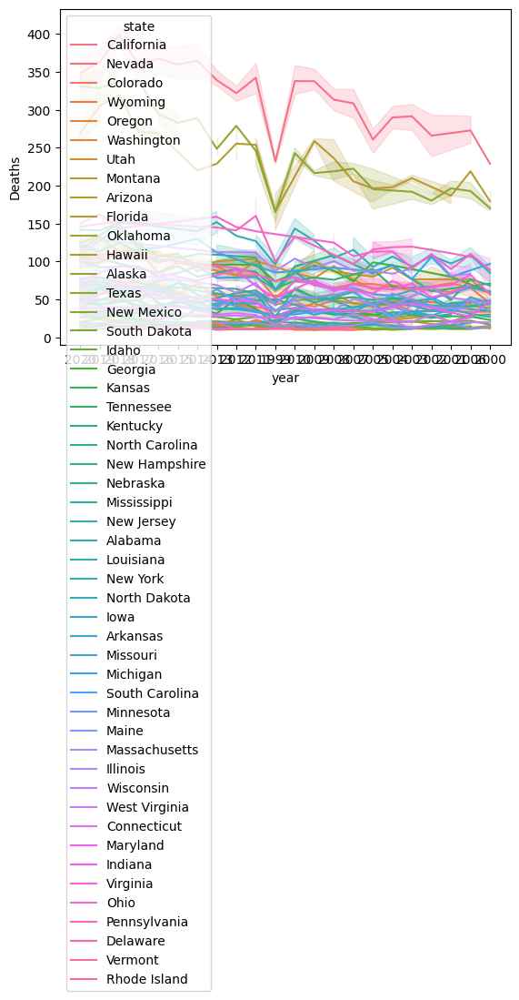

In [201]:
sns.lineplot(data=merged_data2, x='year', y='Deaths', hue='state')

In [202]:
plt.show()

In [203]:
# Consumer Price Index from bureau of labor
inflation = pd.DataFrame(pd.read_csv("CPI.csv"))

In [204]:
inflation

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [205]:
inflation=inflation[10:]

In [206]:
inflation

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
10,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,HALF1,HALF2
11,1990,127.4,128.0,128.7,128.9,129.2,129.9,130.4,131.6,132.7,133.5,133.8,133.8,128.7,132.6
12,1991,134.6,134.8,135.0,135.2,135.6,136.0,136.2,136.6,137.2,137.4,137.8,137.9,135.2,137.2
13,1992,138.1,138.6,139.3,139.5,139.7,140.2,140.5,140.9,141.3,141.8,142.0,141.9,139.2,141.4
14,1993,142.6,143.1,143.6,144.0,144.2,144.4,144.4,144.8,145.1,145.7,145.8,145.8,143.7,145.3
15,1994,146.2,146.7,147.2,147.4,147.5,148.0,148.4,149.0,149.4,149.5,149.7,149.7,147.2,149.3
16,1995,150.3,150.9,151.4,151.9,152.2,152.5,152.5,152.9,153.2,153.7,153.6,153.5,151.5,153.2
17,1996,154.4,154.9,155.7,156.3,156.6,156.7,157.0,157.3,157.8,158.3,158.6,158.6,155.8,157.9
18,1997,159.1,159.6,160.0,160.2,160.1,160.3,160.5,160.8,161.2,161.6,161.5,161.3,159.9,161.2
19,1998,161.6,161.9,162.2,162.5,162.8,163.0,163.2,163.4,163.6,164.0,164.0,163.9,162.3,163.7


In [207]:
inflation.columns=inflation.iloc[0]

In [208]:
inflation=inflation[1:]

In [209]:
inflation.rename(columns = {'Year':'year'}, inplace = True)

/var/folders/qt/65npn54j14qfbrg0py18sw_80000gn/T/ipykernel_82727/361623215.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inflation.rename(columns = {'Year':'year'}, inplace = True)


In [210]:
inflation = inflation.melt(id_vars=['year'], var_name='month', value_name='Value')

In [211]:
inflation

,year,month,Value
0,1990,Jan,127.4
1,1991,Jan,134.6
2,1992,Jan,138.1
3,1993,Jan,142.6
4,1994,Jan,146.2
...,...,...,...
471,2019,HALF2,256.903
472,2020,HALF2,260.065
473,2021,HALF2,275.703
474,2022,HALF2,296.963


In [212]:
inflation_suicide = pd.merge(inflation, suicidesWonder, how='inner', on=['year','month'])

In [213]:
inflation_suicide

,year,month,Value,state,State Code,Year Code,Month,Month Code,Deaths
0,1999,May,166.2,Alabama,1,1999,"May, 1999",1999/05,55
1,1999,May,166.2,Arizona,4,1999,"May, 1999",1999/05,64
2,1999,May,166.2,Arkansas,5,1999,"May, 1999",1999/05,36
3,1999,May,166.2,California,6,1999,"May, 1999",1999/05,277
4,1999,May,166.2,Colorado,8,1999,"May, 1999",1999/05,52
...,...,...,...,...,...,...,...,...,...
1021,2020,May,256.394,Virginia,51,2020,"May, 2020",2020/05,88
1022,2020,May,256.394,Washington,53,2020,"May, 2020",2020/05,96
1023,2020,May,256.394,West Virginia,54,2020,"May, 2020",2020/05,26
1024,2020,May,256.394,Wisconsin,55,2020,"May, 2020",2020/05,83


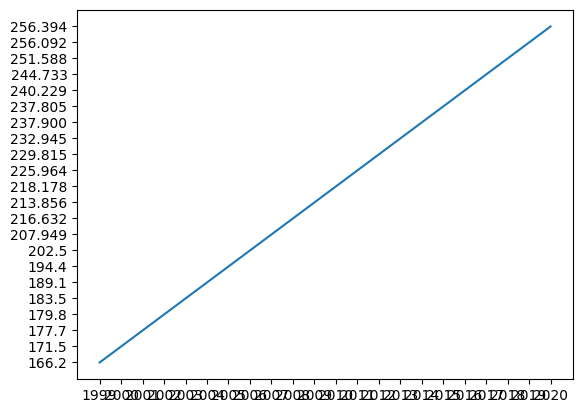

In [214]:
plt.plot(inflation_suicide['year'], inflation_suicide['Value'], label='Inflation')

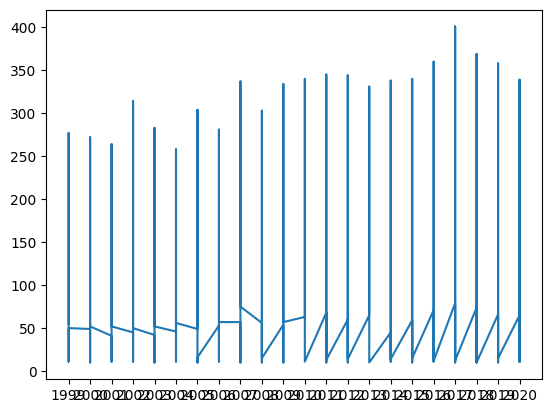

In [215]:
plt.plot(inflation_suicide['year'], inflation_suicide['Deaths'], label='deaths')

In [216]:
inflation_suicide[ 'Month'] = inflation_suicide['month'].apply(lambda x: datetime.strptime(x, '%B').month)

In [217]:
inflation_suicide['Date'] = pd.to_datetime(inflation_suicide[['year', 'Month']].assign(day=1))

In [218]:
inflation_suicide['Date']

0      1999-05-01
1      1999-05-01
2      1999-05-01
3      1999-05-01
4      1999-05-01
          ...    
1021   2020-05-01
1022   2020-05-01
1023   2020-05-01
1024   2020-05-01
1025   2020-05-01
Name: Date, Length: 1026, dtype: datetime64[ns]

In [219]:
inflation_suicide = inflation_suicide.sort_values('Date')

In [220]:
inflation_suicide

,year,month,Value,state,State Code,Year Code,Month,Month Code,Deaths,Date
0,1999,May,166.2,Alabama,1,1999,5,1999/05,55,1999-05-01
24,1999,May,166.2,Nebraska,31,1999,5,1999/05,18,1999-05-01
25,1999,May,166.2,Nevada,32,1999,5,1999/05,42,1999-05-01
26,1999,May,166.2,New Hampshire,33,1999,5,1999/05,13,1999-05-01
27,1999,May,166.2,New Jersey,34,1999,5,1999/05,47,1999-05-01
...,...,...,...,...,...,...,...,...,...,...
996,2020,May,256.394,Maryland,24,2020,5,2020/05,62,2020-05-01
997,2020,May,256.394,Massachusetts,25,2020,5,2020/05,50,2020-05-01
998,2020,May,256.394,Michigan,26,2020,5,2020/05,91,2020-05-01
1000,2020,May,256.394,Mississippi,28,2020,5,2020/05,43,2020-05-01


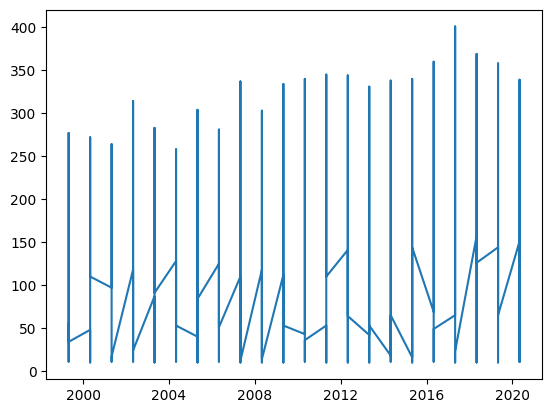

In [221]:
plt.plot(inflation_suicide['Date'], inflation_suicide['Deaths'])

In [222]:
suicides_grouped = suicidesWonder.groupby('year')['Deaths'].sum().reset_index()

In [223]:
suicides_grouped

,year,Deaths
0,1999,28972
1,2000,29047
2,2001,30269
3,2002,31266
4,2003,31138
5,2004,32053
6,2005,32248
7,2006,32962
8,2007,34221
9,2008,35733


In [224]:
inflation_suicide_yearly = pd.merge(inflation, suicides_grouped, how='inner', on=['year'])

In [225]:
inflation_suicide_yearly['Deaths'] = inflation_suicide_yearly['Deaths'].astype(float)
inflation_suicide_yearly['Value'] = inflation_suicide_yearly['Value'].astype(float)


In [226]:
correlation = inflation_suicide_yearly['Deaths'].corr(inflation_suicide_yearly['Value'])

In [227]:
correlation

0.9744195044209997

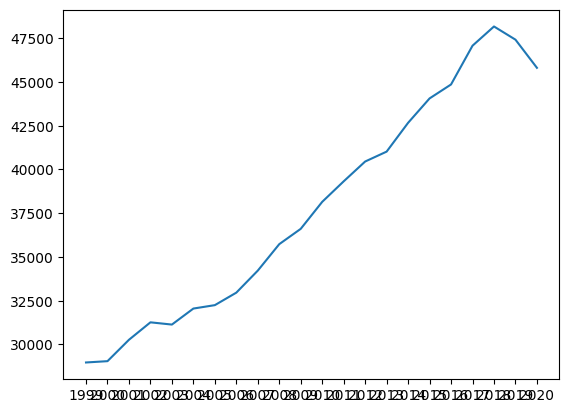

In [228]:
plt.plot(inflation_suicide_yearly['year'], inflation_suicide_yearly['Deaths'], label='Number of Suicides')


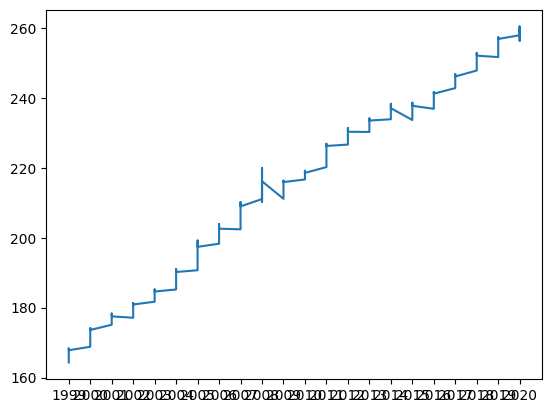

In [229]:
plt.plot(inflation_suicide_yearly['year'], inflation_suicide_yearly['Value'], label='Inflation Rate')


In [230]:
#Question Cases Suicides reported up to a year

suicides_grouped


,year,Deaths
0,1999,28972
1,2000,29047
2,2001,30269
3,2002,31266
4,2003,31138
5,2004,32053
6,2005,32248
7,2006,32962
8,2007,34221
9,2008,35733


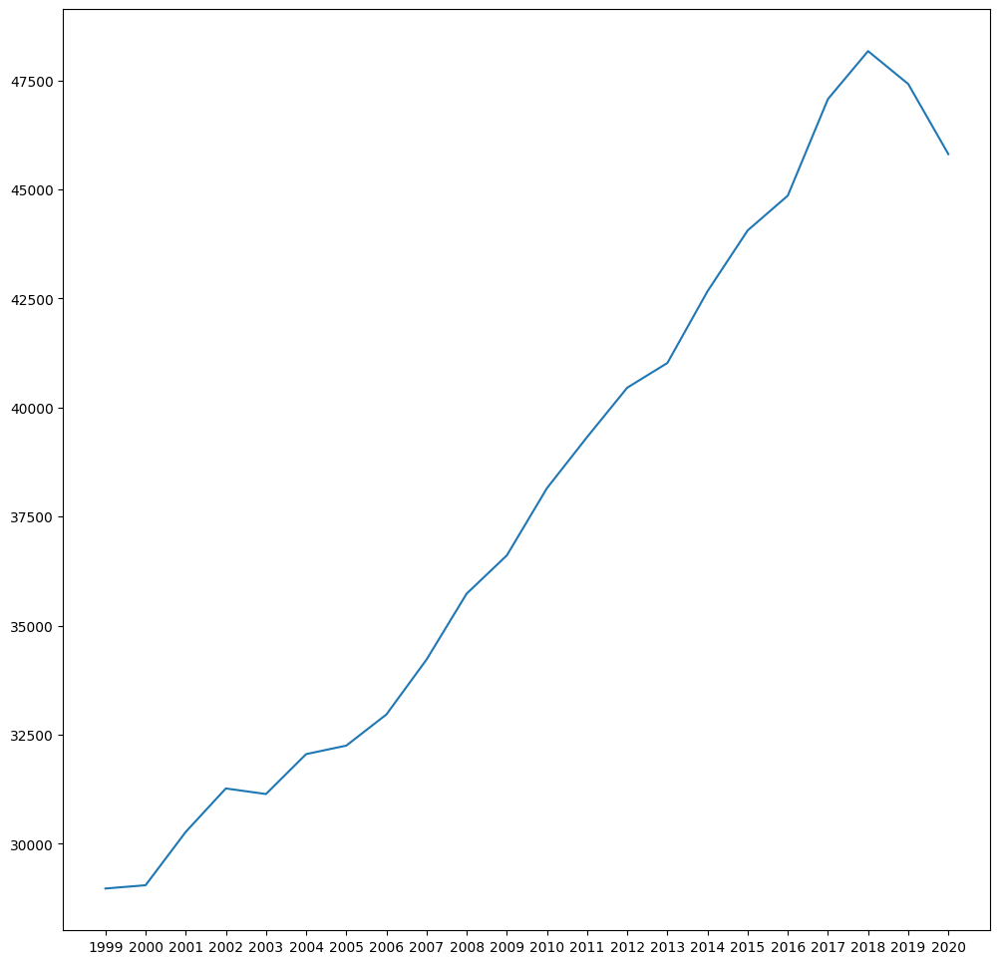

In [254]:
plt.figure(figsize=(12,12))

plt.plot(suicides_grouped['year'], suicides_grouped['Deaths'], label='Number of Suicides')


In [ ]:
#Number of suicides because of inflation


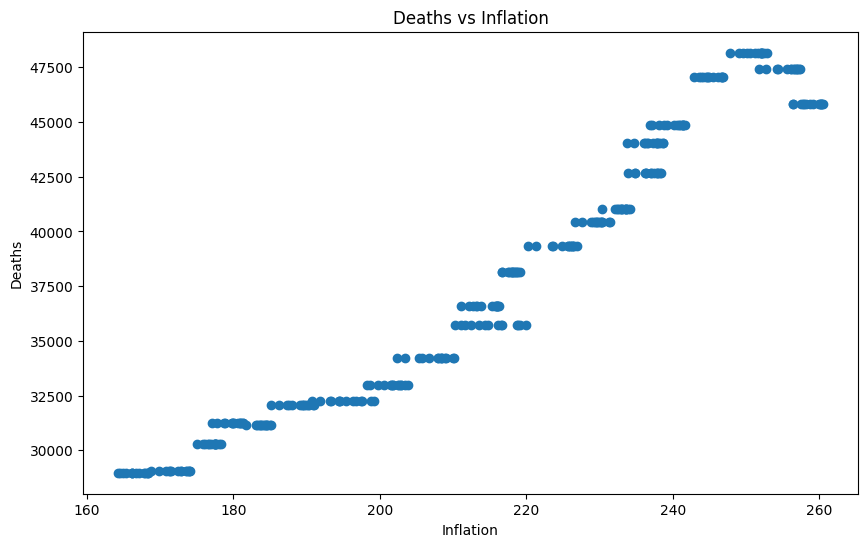

In [245]:

plt.figure(figsize=(10,6))
plt.scatter(inflation_suicide_yearly['Value'], inflation_suicide_yearly['Deaths'])
plt.title('Deaths vs Inflation')
plt.xlabel('Inflation')
plt.ylabel('Deaths')
plt.show()


In [246]:
correlation = inflation_suicide_yearly['Value'].corr(inflation_suicide_yearly['Deaths'])
print(f"The correlation between inflation and deaths is {correlation}")


The correlation between inflation and deaths is 0.9744195044209996


In [252]:
inflation_suicide_yearly.groupby('year').apply(lambda x: x['Value'].corr(x['Deaths']))

year
1999   NaN
2000   NaN
2001   NaN
2002   NaN
2003   NaN
2004   NaN
2005   NaN
2006   NaN
2007   NaN
2008   NaN
2009   NaN
2010   NaN
2011   NaN
2012   NaN
2013   NaN
2014   NaN
2015   NaN
2016   NaN
2017   NaN
2018   NaN
2019   NaN
2020   NaN
dtype: float64

In [ ]:
#Natural events affects emotionally and financially

In [234]:
states = merged_data2['state'].unique()

In [235]:
states

array(['California', 'Nevada', 'Colorado', 'Wyoming', 'Oregon',
       'Washington', 'Utah', 'Montana', 'Arizona', 'Florida', 'Oklahoma',
       'Hawaii', 'Alaska', 'Texas', 'New Mexico', 'South Dakota', 'Idaho',
       'Georgia', 'Kansas', 'Tennessee', 'Kentucky', 'North Carolina',
       'New Hampshire', 'Nebraska', 'Mississippi', 'New Jersey',
       'Alabama', 'Louisiana', 'New York', 'North Dakota', 'Iowa',
       'Arkansas', 'Missouri', 'Michigan', 'South Carolina', 'Minnesota',
       'Maine', 'Massachusetts', 'Illinois', 'Wisconsin', 'West Virginia',
       'Connecticut', 'Maryland', 'Indiana', 'Virginia', 'Ohio',
       'Pennsylvania', 'Delaware', 'Vermont', 'Rhode Island'],
      dtype=object)

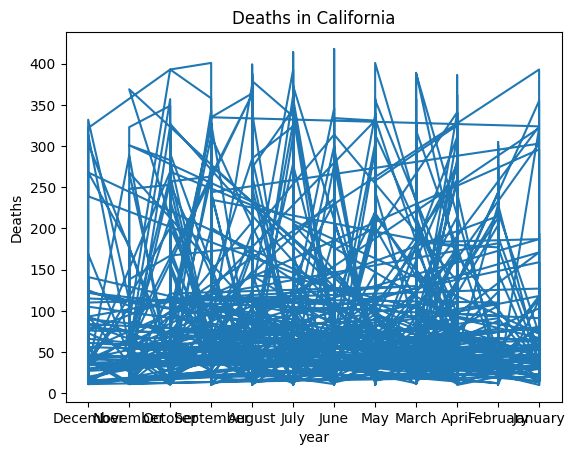

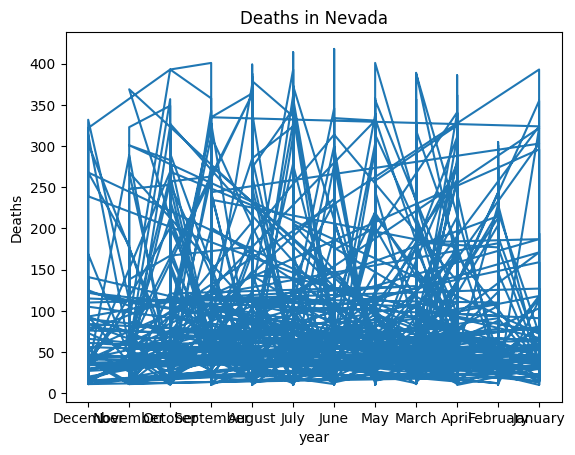

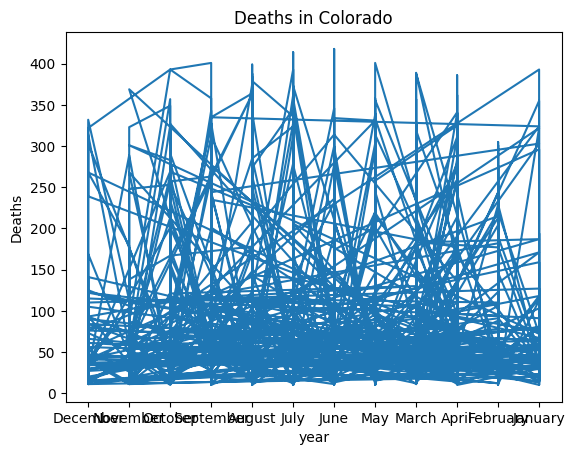

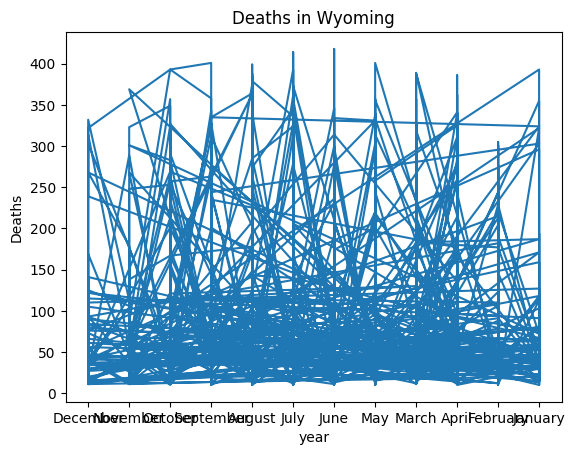

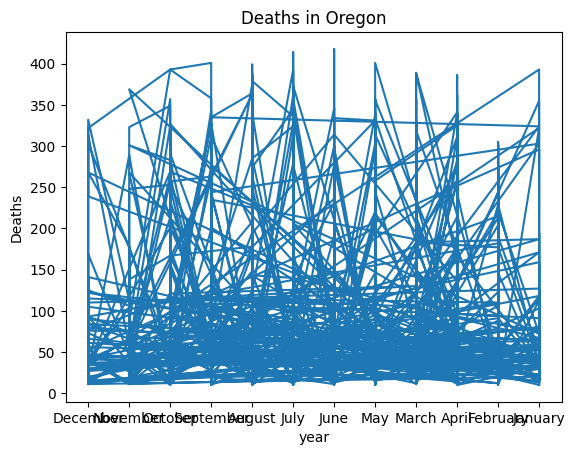

...

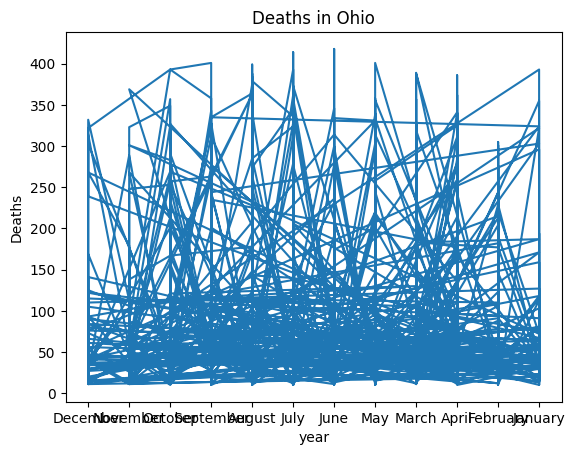

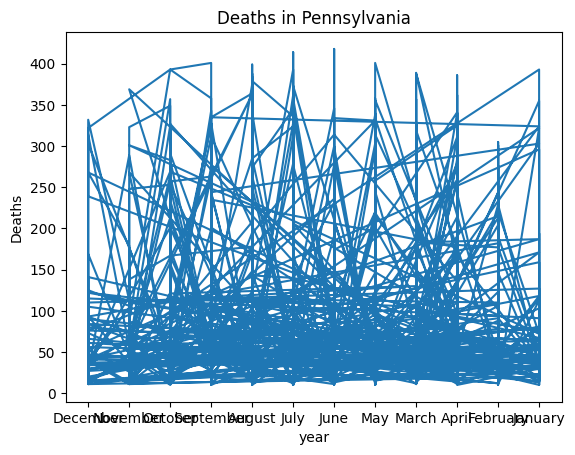

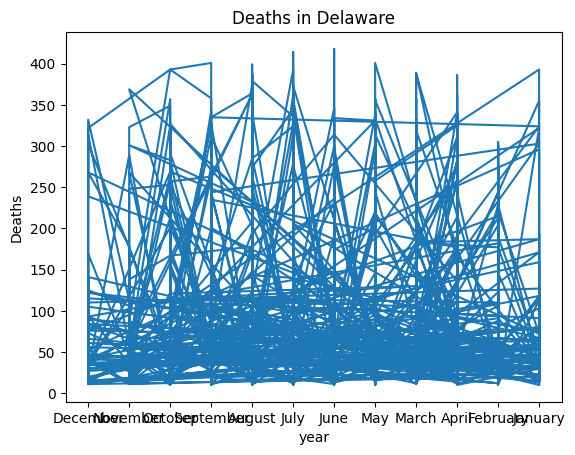

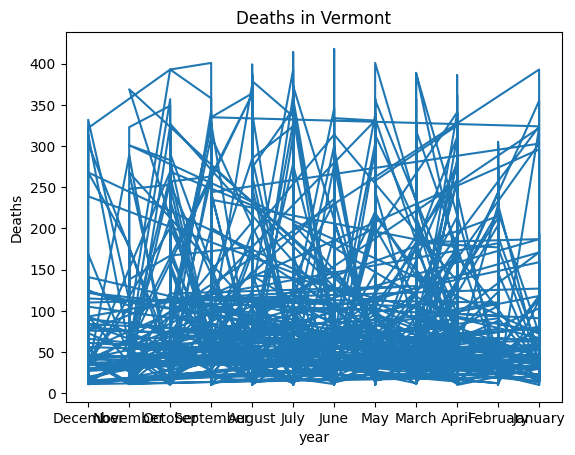

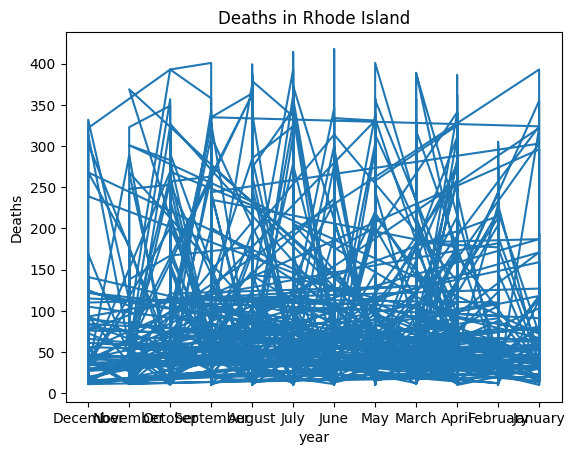

In [240]:
for state in states:
    df_state = merged_data2[merged_data2['state'] == state]
    df_state = df_state.groupby('state').sum()
    
    plt.plot(merged_data2['month'], merged_data2['Deaths'], label='Inflation Rate')
    plt.title(f'Deaths in {state}')
    plt.ylabel('Deaths')
    plt.xlabel('year')
    plt.show()


In [ ]:
merged_data2

In [ ]:
#valor de x inflacion val

In [262]:
inflation_suicide_yearly

,year,month,Value,Deaths
0,1999,Jan,164.300,28972.0
1,1999,Feb,164.500,28972.0
2,1999,Mar,165.000,28972.0
3,1999,Apr,166.200,28972.0
4,1999,May,166.200,28972.0
...,...,...,...,...
303,2020,Oct,260.388,45808.0
304,2020,Nov,260.229,45808.0
305,2020,Dec,260.474,45808.0
306,2020,HALF1,257.557,45808.0


In [276]:
suicides=inflation_suicide_yearly['Deaths']

In [277]:
suicides

0      28972.0
1      28972.0
2      28972.0
3      28972.0
4      28972.0
        ...   
303    45808.0
304    45808.0
305    45808.0
306    45808.0
307    45808.0
Name: Deaths, Length: 308, dtype: float64

In [278]:
inflation=inflation_suicide_yearly['Value']

221.29267506474207

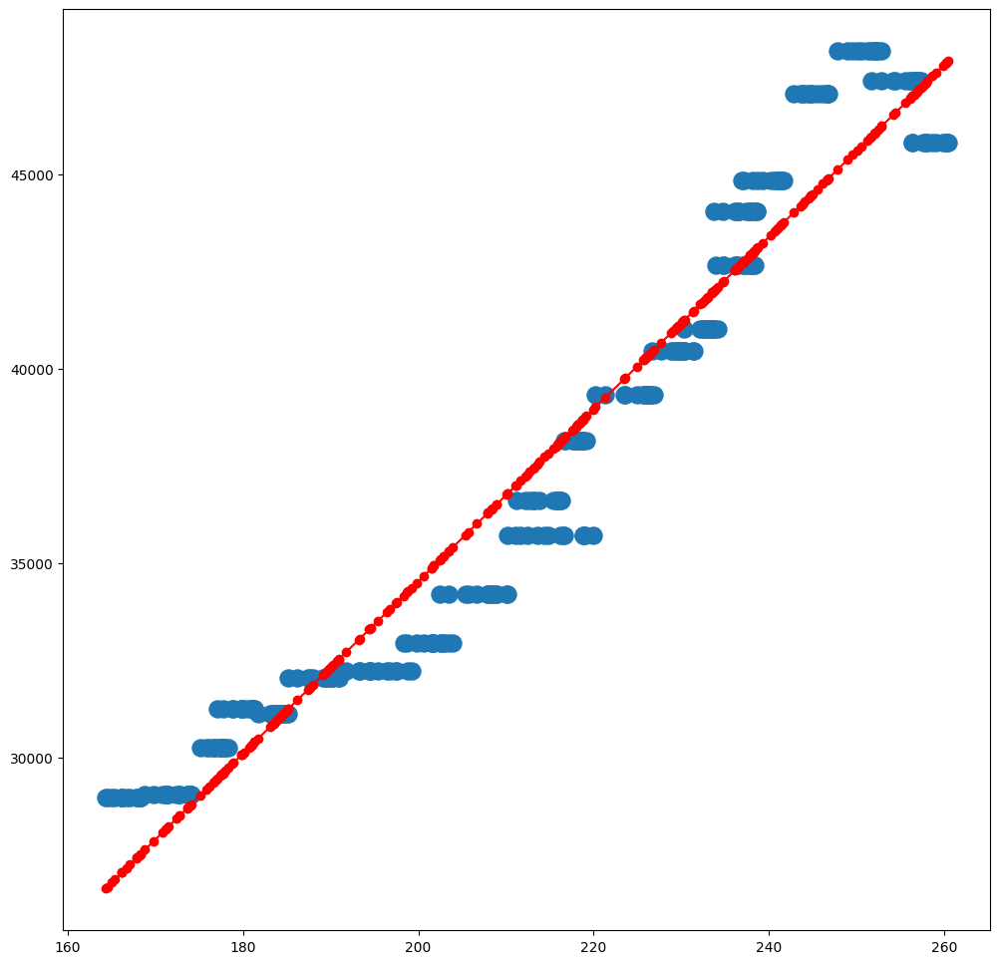

In [280]:

model = skl.LinearRegression()
x = inflation.values.reshape(-1,1)
model.fit(x, suicides)
y_pred = model.predict(x)
plt.figure(figsize=(12,12))

plt.scatter(x, suicides, marker ='.', s= 600)
plt.plot(x, y_pred, "r-o")
model.score(x,suicides)
model.coef_[0]